<a href="https://colab.research.google.com/github/alisharifi2000/ACO_TSP/blob/main/ACO_TSP_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install opencage
!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip
!pip install pyproj==1.9.6

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package libgeos-3.5.0
E: Couldn't find any package by glob 'libgeos-3.5.0'
E: Couldn't find any package by regex 'libgeos-3.5.0'
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.
  Using cached https://github.com/matplotlib/basemap/archive/master.zip
  Created wheel for basemap: filename=basemap-1.2.2+dev-cp36-cp36m-linux_x86_64.whl size=121757238 sha256=2b4a14711fc2445c11f4f56639484a678dabc0a96a3df9eaffc6a26c05df2b2b
  Stored in directory: /tmp/pip-ephem-wheel-cache-bpmikbwt/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
Successfully built basemap


In [2]:
import numpy as np
import pandas as pd
from geopy import distance
from opencage.geocoder import OpenCageGeocode
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import random
from itertools import chain
import time

In [3]:
def draw_map(m, scale=0.2):
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)
    
    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

    # keys contain the plt.Line2D instances
    lat_lines = chain(*(tup[1][0] for tup in lats.items()))
    lon_lines = chain(*(tup[1][0] for tup in lons.items()))
    all_lines = chain(lat_lines, lon_lines)
    
    # cycle through these lines and set the desired style
    for line in all_lines:
        line.set(linestyle='-', alpha=0.3, color='w')

In [4]:
def get_location(city,country):
    key = ''
    geocoder = OpenCageGeocode(key)
    query = city+' , '+country  
    results = geocoder.geocode(query)
    lat = results[0]['geometry']['lat']
    lng = results[0]['geometry']['lng']
    
    return [lat,lng]

In [5]:
def get_city_country(cities):
  city = [c.split(',')[0] for c in cities.split('\n')]
  print(city)
  country = [c.split(',')[1] for c in cities.split('\n')]
  print(country)

  return [city,country]

In [6]:
def make_dataset(city,country):
  # make dataframe 
  dict = {'City':city,'Country':country}
  dataset = pd.DataFrame(dict)
  dataset['lat'] = 0
  dataset['lng'] = 0
  dataset.index = dataset['City']

  return dataset

In [7]:
def fill_lat_lng(dataset):
  for c in list(dataset.index):
      city_name = dataset.loc[c,'City']
      country_name = dataset.loc[c,'Country']
      [lat,lng] = get_location(city_name,country_name)
      dataset.loc[c,'lat'] = lat
      dataset.loc[c,'lng'] = lng
    
  return dataset

In [8]:
def draw_cities_in_map(dataset):
  fig = plt.figure(figsize=(15, 10), edgecolor='w')
  m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )
  m.scatter(dataset['lng'], dataset['lat'], latlon=True,
          c = 'black', s = 5)
  draw_map(m)

In [9]:
def make_dict_from_dataset(dataset):
    dict = {}
    for c in dataset['City'].values:
        name = dataset.loc[c,'City']
        lat = dataset.loc[c,'lat']
        lng = dataset.loc[c,'lng']

        dict[name] = [lat,lng]
    
    return dict

In [10]:
class Graph(object):
    def __init__(self, cost_matrix: list, rank: int):
        """
        :param cost_matrix:
        :param rank: rank of the cost matrix
        """
        self.matrix = cost_matrix
        self.rank = rank
        # noinspection PyUnusedLocal
        self.pheromone = [[1 / (rank * rank) for j in range(rank)] for i in range(rank)]

In [11]:
class ACO(object):
    def __init__(self, ant_count = 10, generations = 50, alpha = 1.0, beta = 10.0, rho = 0.5, q = 10,
                 strategy = 2):
        """
        :param ant_count: int 
        :param generations: int
        :param alpha: relative importance of pheromone : float
        :param beta: relative importance of heuristic information : float
        :param rho: pheromone residual coefficient : float
        :param q: pheromone intensity : int
        :param strategy: pheromone update strategy. 0 - ant-cycle, 1 - ant-quality, 2 - ant-density : int
        """
        self.Q = q
        self.rho = rho
        self.beta = beta
        self.alpha = alpha
        self.ant_count = ant_count
        self.generations = generations
        self.update_strategy = strategy
        self.history = {}

    def _update_pheromone(self, graph: Graph, ants: list):
        for i, row in enumerate(graph.pheromone):
            for j, col in enumerate(row):
                graph.pheromone[i][j] *= self.rho
                for ant in ants:
                    graph.pheromone[i][j] += ant.pheromone_delta[i][j]

    # noinspection PyProtectedMember
    def solve(self, graph: Graph):
        """
        :param graph:
        """
        best_cost = float('inf')
        best_solution = []
        history_iter = []
        for gen in range(self.generations):
            # noinspection PyUnusedLocal
            ants = [_Ant(self, graph) for i in range(self.ant_count)]
            for ant in ants:
                for i in range(graph.rank - 1):
                    ant._select_next()
                ant.total_cost += graph.matrix[ant.tabu[-1]][ant.tabu[0]]
                if ant.total_cost < best_cost:
                    best_cost = ant.total_cost
                    best_solution = [] + ant.tabu
                # update pheromone
                ant._update_pheromone_delta()
            self._update_pheromone(graph, ants)
            #print('generation #{}, best cost: {}, path: {}'.format(gen, best_cost, best_solution))
            history_iter.append(best_cost)
        self.history = {'history' : history_iter}
        return best_solution, best_cost

In [12]:
class _Ant(object):
    def __init__(self, aco: ACO, graph: Graph):
        self.colony = aco
        self.graph = graph
        self.total_cost = 0.0
        self.tabu = []  # tabu list
        self.pheromone_delta = []  # the local increase of pheromone
        self.allowed = [i for i in range(graph.rank)]  # nodes which are allowed for the next selection
        self.eta = [[0 if i == j else 1 / graph.matrix[i][j] for j in range(graph.rank)] for i in
                    range(graph.rank)]  # heuristic information
        start = random.randint(0, graph.rank - 1)  # start from any node
        self.tabu.append(start)
        self.current = start
        self.allowed.remove(start)

    def _select_next(self):
        denominator = 0
        for i in self.allowed:
            denominator += self.graph.pheromone[self.current][i] ** self.colony.alpha * self.eta[self.current][
                                                                                            i] ** self.colony.beta
        # noinspection PyUnusedLocal
        probabilities = [0 for i in range(self.graph.rank)]  # probabilities for moving to a node in the next step
        for i in range(self.graph.rank):
            try:
                self.allowed.index(i)  # test if allowed list contains i
                probabilities[i] = self.graph.pheromone[self.current][i] ** self.colony.alpha * \
                    self.eta[self.current][i] ** self.colony.beta / denominator
            except ValueError:
                pass  # do nothing
        # select next node by probability roulette
        selected = 0
        rand = random.random()
        for i, probability in enumerate(probabilities):
            rand -= probability
            if rand <= 0:
                selected = i
                break
        self.allowed.remove(selected)
        self.tabu.append(selected)
        self.total_cost += self.graph.matrix[self.current][selected]
        self.current = selected

    # noinspection PyUnusedLocal
    def _update_pheromone_delta(self):
        self.pheromone_delta = [[0 for j in range(self.graph.rank)] for i in range(self.graph.rank)]
        for _ in range(1, len(self.tabu)):
            i = self.tabu[_ - 1]
            j = self.tabu[_]
            if self.colony.update_strategy == 1:  # ant-quality system
                self.pheromone_delta[i][j] = self.colony.Q
            elif self.colony.update_strategy == 2:  # ant-density system
                # noinspection PyTypeChecker
                self.pheromone_delta[i][j] = self.colony.Q / self.graph.matrix[i][j]
            else:  # ant-cycle system
                self.pheromone_delta[i][j] = self.colony.Q / self.total_cost

In [13]:
def find_distance(city1: dict, city2: dict):
    orign = tuple(city1)
    dist = tuple(city2)
    d = int(distance.distance(orign,dist).km)
    return d

In [14]:
def make_cost_matrix(city_dict):
    city_names = list(city_dict.keys())
    cost_matrix = []
    rank = len(city_dict.keys())
    for i in range(rank):
        row = []
        for j in range(rank):
            row.append(find_distance(city_dict[city_names[i]], city_dict[city_names[j]]))
        cost_matrix.append(row)

    return cost_matrix

In [15]:
def make_city_name(city_dict):
    names = {}
    for i in range(len(list(city_dict.keys()))):
        names[i] = list(city_dict.keys())[i]

    return names

In [16]:
def rename_path(path,names_dict):
    path_cities = []
    for items in path:
        city_index = items
        city_name = names_dict[city_index]
        path_cities.append(city_name)
    return path_cities

In [17]:
def plot_route(path,city_dict):
    plt.figure(figsize=(15, 10), edgecolor='w')
    plt.title("Best Route (start point is blue )")
    m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )
    
    lat = []
    lon = []

    for i in range(len(path)):
      lat.append(city_dict[path[i]][0])
      lon.append(city_dict[path[i]][1])

    x, y = m(lon, lat)

    
    m.plot(x, y, '--', markersize=4, linewidth=1 , c = 'red')

    m.scatter(x, y, latlon=True,
          c = 'black', s = 8)
    
    m.scatter(lon[0], lat[0], latlon=True,
          c = 'blue', s = 15 , marker = 'x')
    
    draw_map(m)

In [18]:
def show_best_path(path,min_cost,run_time):
    print('ACO completed')
    print(f'TSP for {len(path)} cities')
    print(f'Minimum travelling cost {min_cost} KM')
    print(f"Evolution in {run_time} s")
    print('-----------------')
    print('Best Path : ')
    print('-----------------')
    for i in range(len(path)):
        print(f"{i+1}. {path[i]}")

In [19]:
def plot_aco_convergence(costs,min_cost):
    x = range(len(costs))
    plt.figure(figsize=(10, 5), edgecolor='w')
    plt.title("ACO Convergence")
    plt.xlabel('Iteration')
    plt.ylabel('cost (KM)')
    plt.text(x[len(x) // 2], costs[0], 'min cost: {} KM'.format(min_cost), ha='center', va='center')
    plt.plot(x, costs, '-')

# 10 Citites

In [20]:
# 10 cities
cities = """New York,USA
Berlin,Germany
Chicago,USA
London,UK
Paris,France
Tehran,Iran
Istanbul,Turkey
San Francisco,USA
Vienna,Austria
Boston,USA"""

In [21]:
result = get_city_country(cities)
dataset = make_dataset(result[0],result[1])
dataset = fill_lat_lng(dataset)
city_dict = make_dict_from_dataset(dataset)
names_dict = make_city_name(city_dict)
dataset.head()

['New York', 'Berlin', 'Chicago', 'London', 'Paris', 'Tehran', 'Istanbul', 'San Francisco', 'Vienna', 'Boston']
['USA', 'Germany', 'USA', 'UK', 'France', 'Iran', 'Turkey', 'USA', 'Austria', 'USA']


,City,Country,lat,lng
City,,,,
New York,New York,USA,40.712728,-74.006015
Berlin,Berlin,Germany,52.517037,13.388860
Chicago,Chicago,USA,41.875562,-87.624421
London,London,UK,51.507322,-0.127647
Paris,Paris,France,48.856697,2.351462


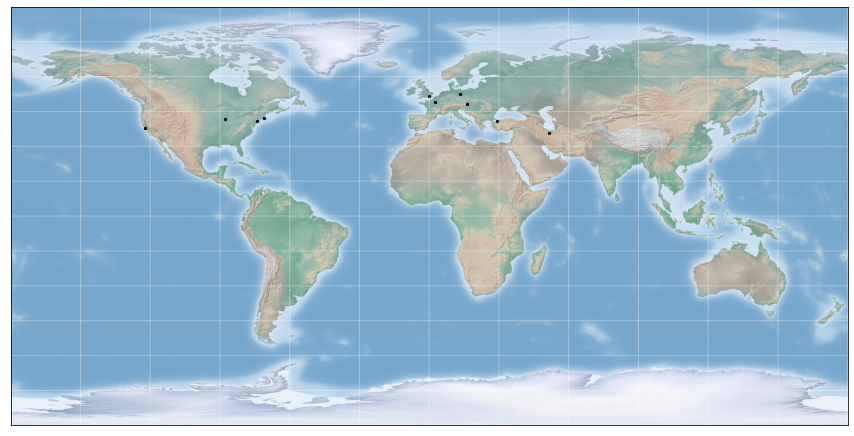

In [22]:
draw_cities_in_map(dataset)

## defult parameters

ACO completed
TSP for 10 cities
Minimum travelling cost 26629.0 KM
Evolution in 0.10530591011047363 s
-----------------
Best Path : 
-----------------
1. Tehran
2. Istanbul
3. Vienna
4. Berlin
5. Paris
6. London
7. Boston
8. New York
9. Chicago
10. San Francisco


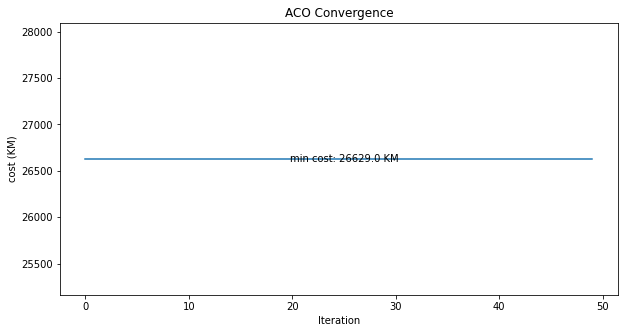

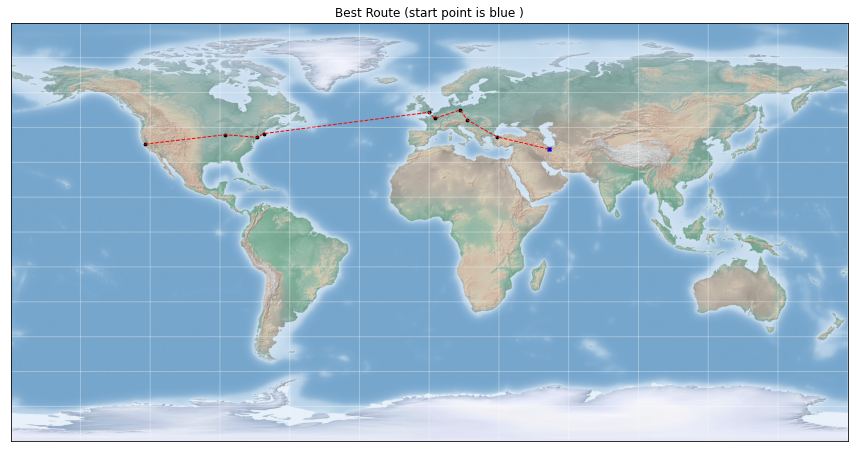

In [23]:
'''
defult parameters:
ant_count: 10
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO()
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO()
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

# 30 Cities

In [24]:
# 30 cities
cities = """New York,USA
Munich,Germany
Warsaw,Poland
Stockholm,Sweden
Barcelona,Spain
Helsinki,Finland
Tallinn,Estonia
Amsterdam,Netherlands
Prague,the Czech Republic
Madrid,Spain
Rome,Italy
Budapest,Hungary
Lisbon,Portugal
Copenhagen,Denmark
Dublin,Republic of Ireland
Athens,Greece
Berlin,Germany
Chicago,USA
London,UK
Paris,France
Tehran,Iran
Oslo,Norway
Istanbul,Turkey
Bucharest,Romania
Shiraz,Iran
Mashhad,Iran
Qom,Iran
San Francisco,USA
Vienna,Austria
Boston,USA"""

In [25]:
result = get_city_country(cities)
dataset = make_dataset(result[0],result[1])
dataset = fill_lat_lng(dataset)
city_dict = make_dict_from_dataset(dataset)
names_dict = make_city_name(city_dict)
dataset.head()

['New York', 'Munich', 'Warsaw', 'Stockholm', 'Barcelona', 'Helsinki', 'Tallinn', 'Amsterdam', 'Prague', 'Madrid', 'Rome', 'Budapest', 'Lisbon', 'Copenhagen', 'Dublin', 'Athens', 'Berlin', 'Chicago', 'London', 'Paris', 'Tehran', 'Oslo', 'Istanbul', 'Bucharest', 'Shiraz', 'Mashhad', 'Qom', 'San Francisco', 'Vienna', 'Boston']
['USA', 'Germany', 'Poland', 'Sweden', 'Spain', 'Finland', 'Estonia', 'Netherlands', 'the Czech Republic', 'Spain', 'Italy', 'Hungary', 'Portugal', 'Denmark', 'Republic of Ireland', 'Greece', 'Germany', 'USA', 'UK', 'France', 'Iran', 'Norway', 'Turkey', 'Romania', 'Iran', 'Iran', 'Iran', 'USA', 'Austria', 'USA']


,City,Country,lat,lng
City,,,,
New York,New York,USA,40.712728,-74.006015
Munich,Munich,Germany,48.137108,11.575382
Warsaw,Warsaw,Poland,52.231958,21.006725
Stockholm,Stockholm,Sweden,59.325117,18.071093
Barcelona,Barcelona,Spain,41.382894,2.177432


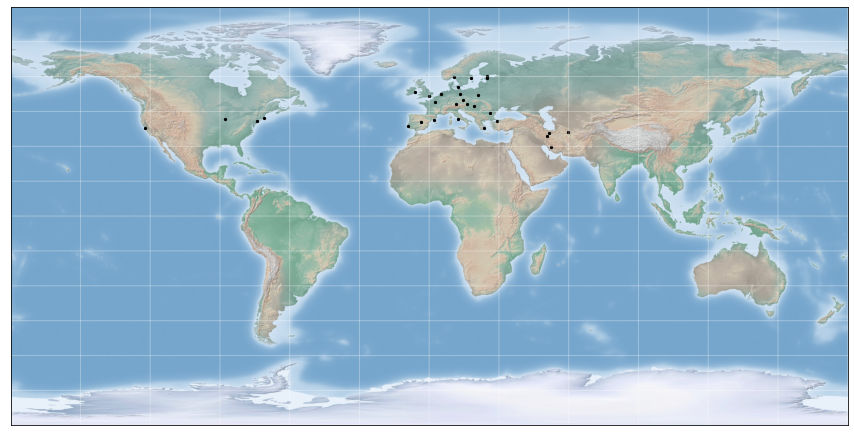

In [26]:
draw_cities_in_map(dataset)

## defult parameters

ACO completed
TSP for 30 cities
Minimum travelling cost 35881.0 KM
Evolution in 0.6417021751403809 s
-----------------
Best Path : 
-----------------
1. Lisbon
2. Madrid
3. Barcelona
4. Rome
5. Munich
6. Prague
7. Vienna
8. Budapest
9. Warsaw
10. Bucharest
11. Istanbul
12. Athens
13. Qom
14. Tehran
15. Shiraz
16. Mashhad
17. Tallinn
18. Helsinki
19. Stockholm
20. Oslo
21. Copenhagen
22. Berlin
23. Amsterdam
24. London
25. Paris
26. Dublin
27. Boston
28. New York
29. Chicago
30. San Francisco


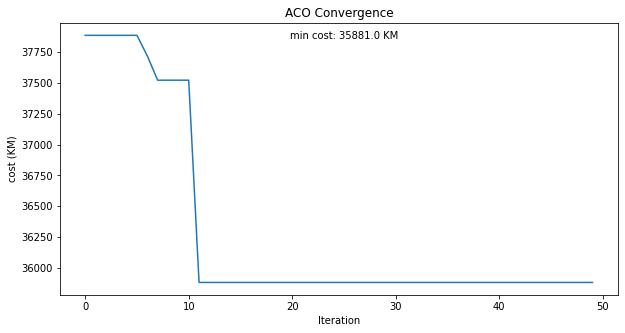

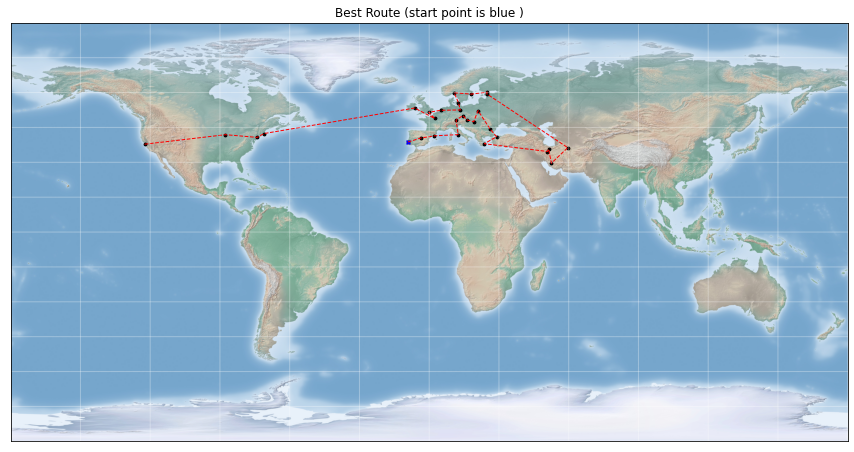

In [27]:
'''
defult parameters:
ant_count: 10
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO()
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO()
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## ant_count = 1

ACO completed
TSP for 30 cities
Minimum travelling cost 35858.0 KM
Evolution in 0.0736384391784668 s
-----------------
Best Path : 
-----------------
1. Istanbul
2. Bucharest
3. Budapest
4. Vienna
5. Prague
6. Munich
7. Berlin
8. Copenhagen
9. Oslo
10. Stockholm
11. Tallinn
12. Helsinki
13. Warsaw
14. Amsterdam
15. London
16. Paris
17. Dublin
18. Boston
19. New York
20. Chicago
21. San Francisco
22. Lisbon
23. Madrid
24. Barcelona
25. Rome
26. Athens
27. Qom
28. Tehran
29. Shiraz
30. Mashhad


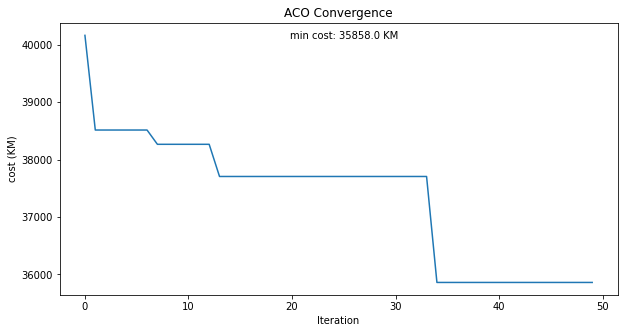

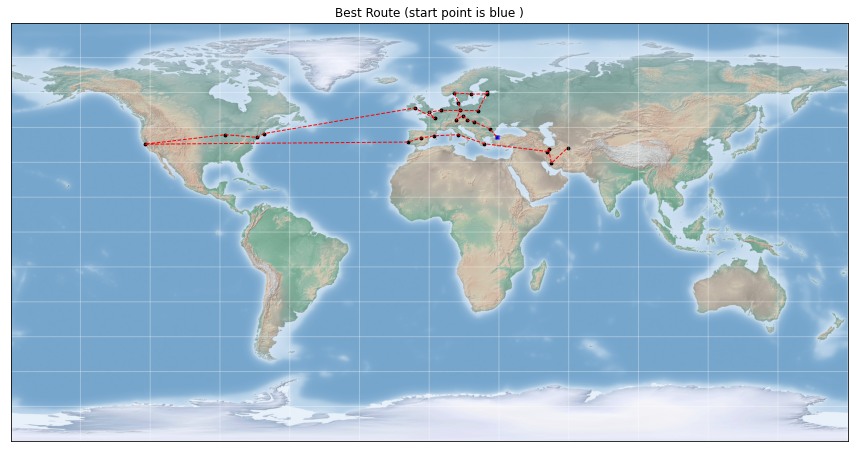

In [28]:
'''
defult parameters:
ant_count: 10 -> 1
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(ant_count = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(ant_count = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## ant_counts = 100

ACO completed
TSP for 30 cities
Minimum travelling cost 35103.0 KM
Evolution in 6.8686323165893555 s
-----------------
Best Path : 
-----------------
1. Boston
2. New York
3. Chicago
4. San Francisco
5. Dublin
6. London
7. Amsterdam
8. Paris
9. Munich
10. Prague
11. Vienna
12. Budapest
13. Warsaw
14. Berlin
15. Copenhagen
16. Oslo
17. Stockholm
18. Tallinn
19. Helsinki
20. Tehran
21. Qom
22. Shiraz
23. Mashhad
24. Istanbul
25. Bucharest
26. Athens
27. Rome
28. Barcelona
29. Madrid
30. Lisbon


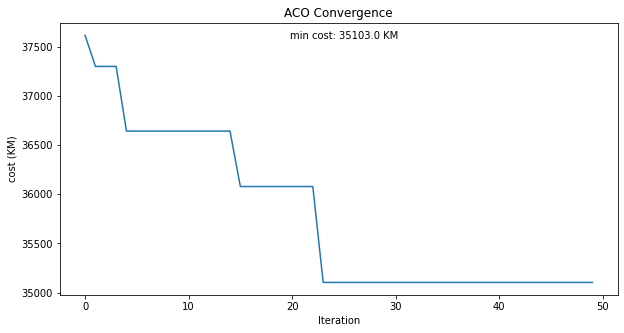

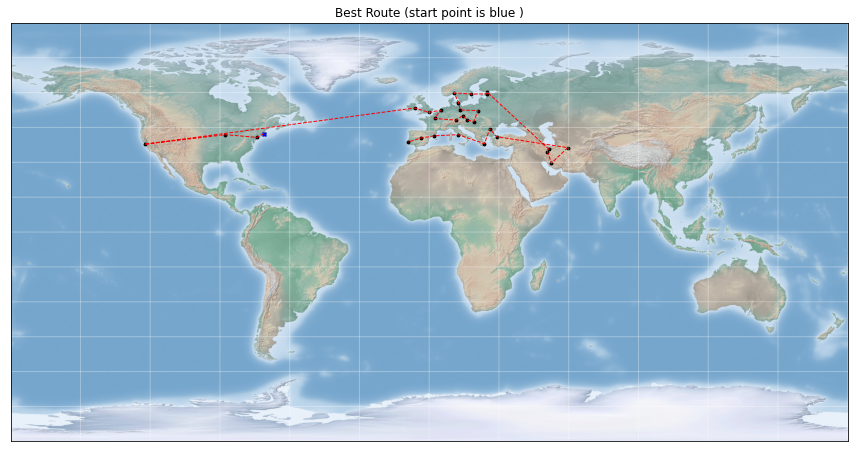

In [29]:
'''
defult parameters:
ant_count: 10 -> 100
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(ant_count = 100)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(ant_count = 100)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## alpha = 5.0

ACO completed
TSP for 30 cities
Minimum travelling cost 35310.0 KM
Evolution in 0.6739335060119629 s
-----------------
Best Path : 
-----------------
1. Boston
2. New York
3. Chicago
4. San Francisco
5. Dublin
6. Amsterdam
7. London
8. Paris
9. Munich
10. Prague
11. Vienna
12. Budapest
13. Warsaw
14. Berlin
15. Copenhagen
16. Oslo
17. Stockholm
18. Tallinn
19. Helsinki
20. Tehran
21. Qom
22. Shiraz
23. Mashhad
24. Istanbul
25. Bucharest
26. Athens
27. Rome
28. Barcelona
29. Madrid
30. Lisbon


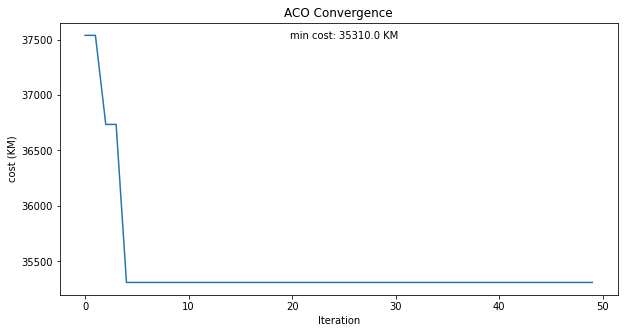

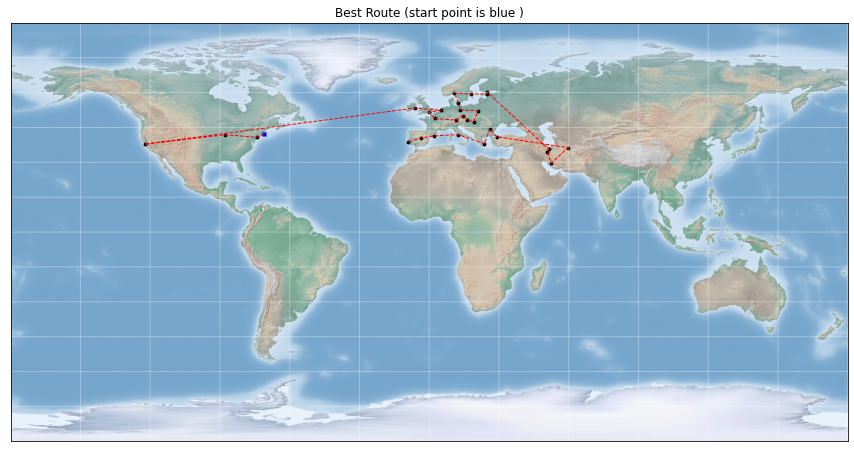

In [30]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 -> 5.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(alpha = 5.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(alpha = 5.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## beta = 5.0

ACO completed
TSP for 30 cities
Minimum travelling cost 35043.0 KM
Evolution in 0.6581063270568848 s
-----------------
Best Path : 
-----------------
1. Boston
2. New York
3. Chicago
4. San Francisco
5. Dublin
6. London
7. Paris
8. Amsterdam
9. Munich
10. Prague
11. Vienna
12. Budapest
13. Warsaw
14. Berlin
15. Copenhagen
16. Oslo
17. Stockholm
18. Helsinki
19. Tallinn
20. Tehran
21. Qom
22. Shiraz
23. Mashhad
24. Istanbul
25. Bucharest
26. Athens
27. Rome
28. Barcelona
29. Madrid
30. Lisbon


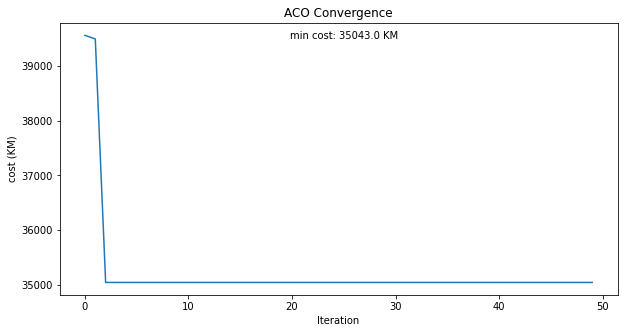

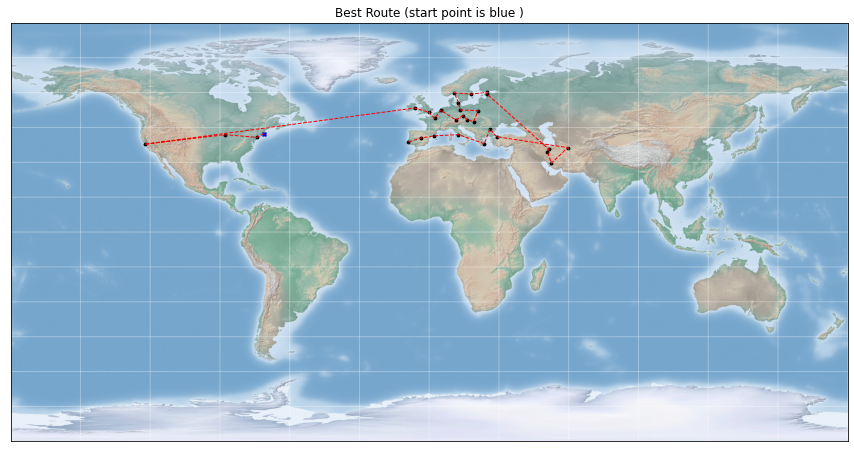

In [31]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 -> 5.0
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(beta = 5.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(beta = 5.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## beta = 1.0

ACO completed
TSP for 30 cities
Minimum travelling cost 35309.0 KM
Evolution in 0.6370158195495605 s
-----------------
Best Path : 
-----------------
1. Boston
2. New York
3. Chicago
4. San Francisco
5. Dublin
6. London
7. Paris
8. Amsterdam
9. Berlin
10. Copenhagen
11. Stockholm
12. Helsinki
13. Tallinn
14. Oslo
15. Warsaw
16. Munich
17. Prague
18. Vienna
19. Budapest
20. Bucharest
21. Istanbul
22. Tehran
23. Qom
24. Shiraz
25. Mashhad
26. Athens
27. Rome
28. Barcelona
29. Madrid
30. Lisbon


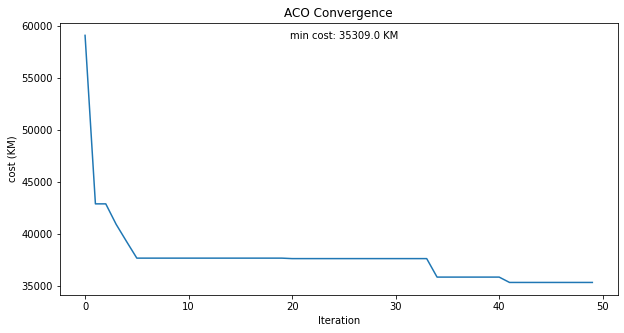

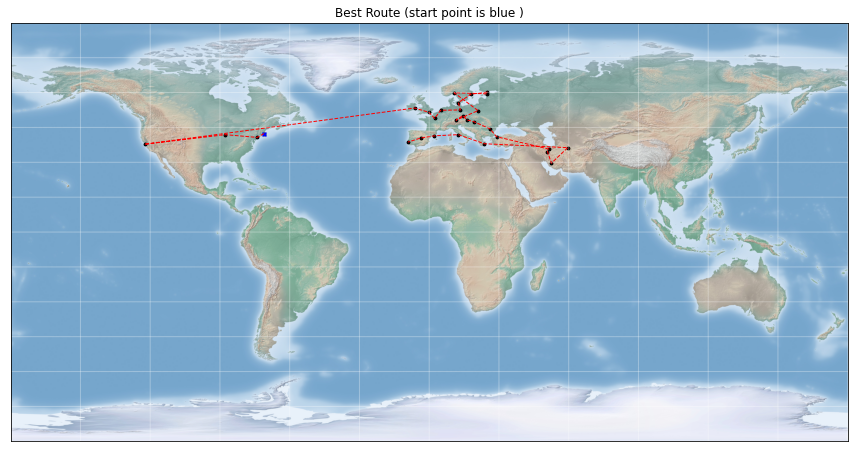

In [32]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 -> 1.0
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(beta = 1.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(beta = 1.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## alpha = 5.0 & beta = 5.0

ACO completed
TSP for 30 cities
Minimum travelling cost 35602.0 KM
Evolution in 0.6927058696746826 s
-----------------
Best Path : 
-----------------
1. Dublin
2. London
3. Paris
4. Amsterdam
5. Munich
6. Prague
7. Vienna
8. Budapest
9. Warsaw
10. Tallinn
11. Helsinki
12. Stockholm
13. Oslo
14. Copenhagen
15. Berlin
16. Tehran
17. Qom
18. Shiraz
19. Mashhad
20. Istanbul
21. Bucharest
22. Athens
23. Rome
24. Barcelona
25. Madrid
26. Lisbon
27. Boston
28. New York
29. Chicago
30. San Francisco


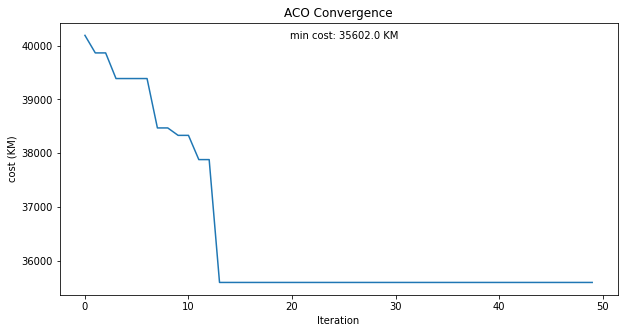

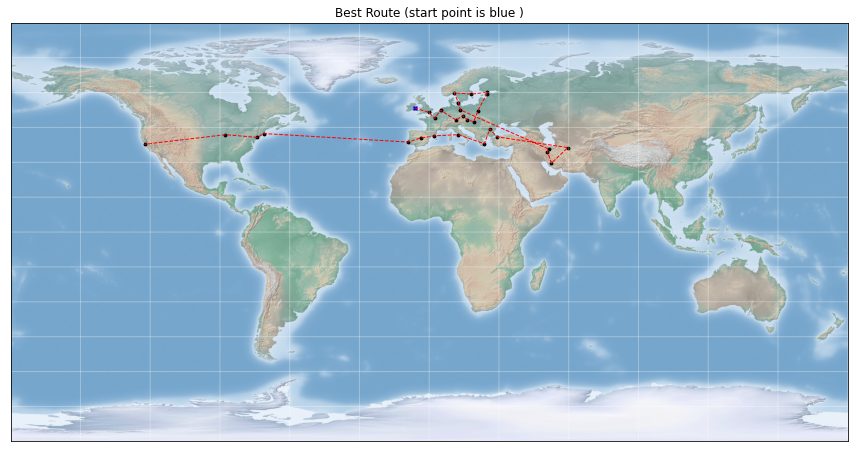

In [33]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 -> 5.0
beta: 10.0 -> 5.0
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(alpha = 5.0,beta = 5.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(alpha = 5.0,beta = 5.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## rho = 0.9

ACO completed
TSP for 30 cities
Minimum travelling cost 36042.0 KM
Evolution in 0.64959716796875 s
-----------------
Best Path : 
-----------------
1. San Francisco
2. Chicago
3. New York
4. Boston
5. Lisbon
6. Madrid
7. Barcelona
8. Paris
9. London
10. Amsterdam
11. Berlin
12. Prague
13. Vienna
14. Budapest
15. Warsaw
16. Munich
17. Rome
18. Athens
19. Istanbul
20. Bucharest
21. Tehran
22. Qom
23. Shiraz
24. Mashhad
25. Helsinki
26. Tallinn
27. Stockholm
28. Oslo
29. Copenhagen
30. Dublin


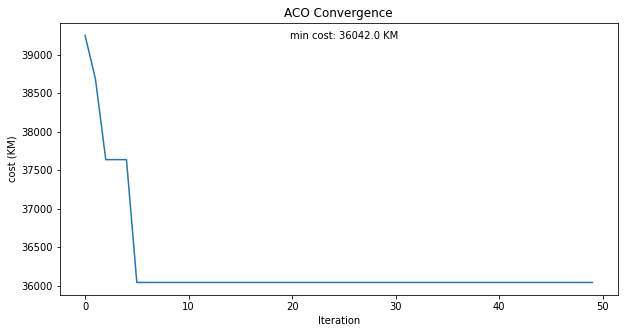

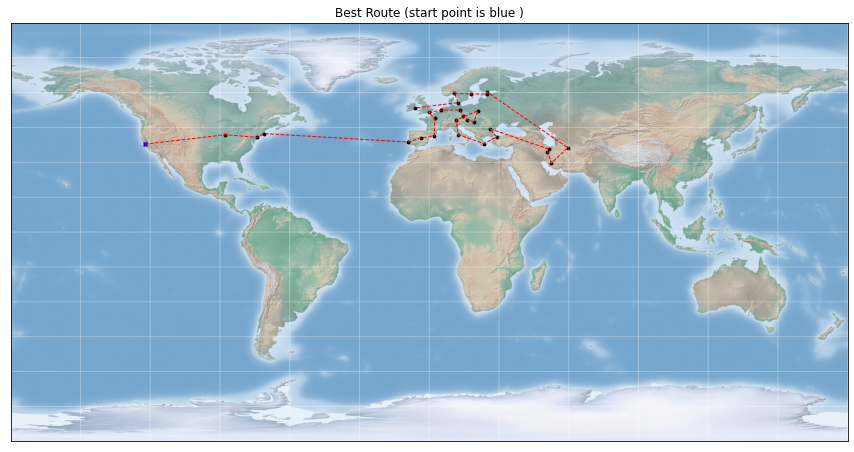

In [34]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 
rho: 0.5 -> 0.9
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(rho = 0.9)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(rho = 0.9)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## rho = 1.0

ACO completed
TSP for 30 cities
Minimum travelling cost 35290.0 KM
Evolution in 0.6608867645263672 s
-----------------
Best Path : 
-----------------
1. Dublin
2. London
3. Paris
4. Amsterdam
5. Berlin
6. Copenhagen
7. Oslo
8. Stockholm
9. Tallinn
10. Helsinki
11. Warsaw
12. Munich
13. Prague
14. Vienna
15. Budapest
16. Tehran
17. Qom
18. Shiraz
19. Mashhad
20. Istanbul
21. Bucharest
22. Athens
23. Rome
24. Barcelona
25. Madrid
26. Lisbon
27. Boston
28. New York
29. Chicago
30. San Francisco


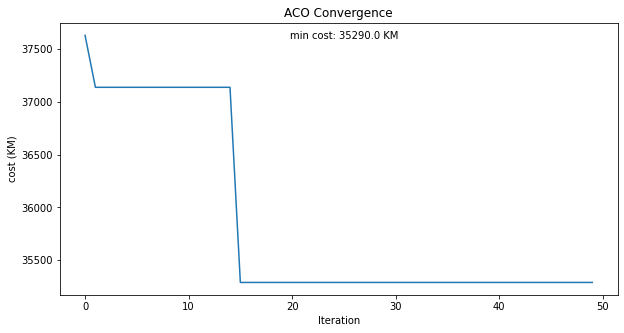

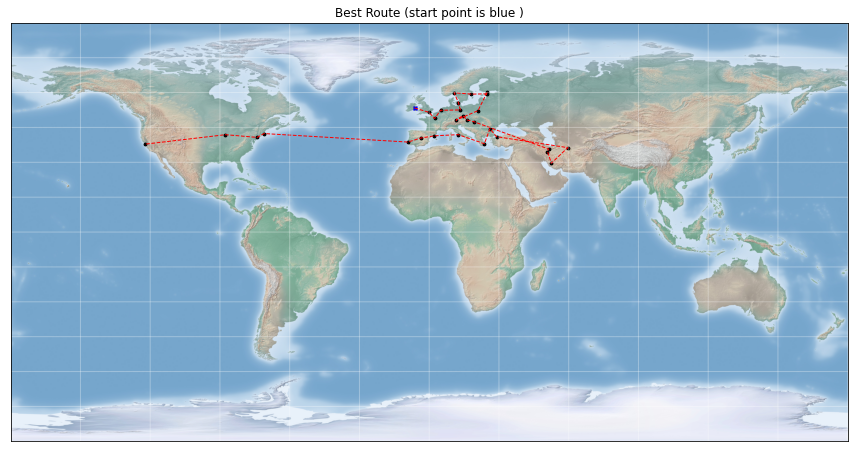

In [35]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 
rho: 0.5 -> 0.1
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(rho = 0.1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(rho = 0.1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## q = 1

ACO completed
TSP for 30 cities
Minimum travelling cost 35975.0 KM
Evolution in 0.6550142765045166 s
-----------------
Best Path : 
-----------------
1. Lisbon
2. Madrid
3. Barcelona
4. Rome
5. Munich
6. Prague
7. Vienna
8. Budapest
9. Bucharest
10. Istanbul
11. Athens
12. Tehran
13. Qom
14. Shiraz
15. Mashhad
16. Tallinn
17. Helsinki
18. Stockholm
19. Oslo
20. Copenhagen
21. Berlin
22. Warsaw
23. Amsterdam
24. London
25. Paris
26. Dublin
27. Boston
28. New York
29. Chicago
30. San Francisco


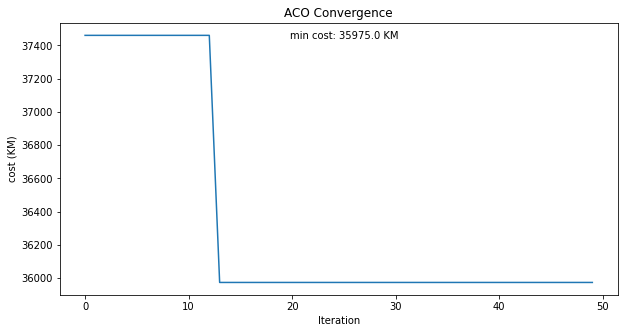

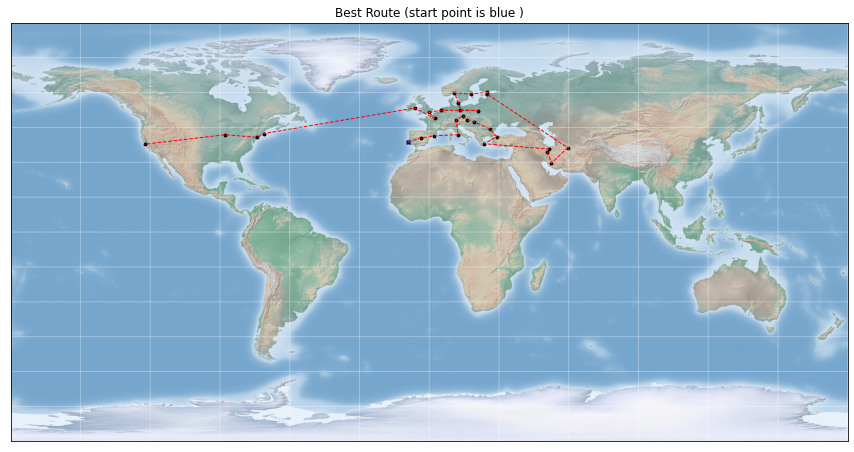

In [36]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 
rho: 0.5 
q: 10 -> 1
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(q = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(q = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## q = 100

ACO completed
TSP for 30 cities
Minimum travelling cost 35982.0 KM
Evolution in 0.6510705947875977 s
-----------------
Best Path : 
-----------------
1. San Francisco
2. Chicago
3. New York
4. Boston
5. Dublin
6. London
7. Amsterdam
8. Paris
9. Barcelona
10. Madrid
11. Lisbon
12. Rome
13. Munich
14. Prague
15. Vienna
16. Budapest
17. Bucharest
18. Istanbul
19. Athens
20. Tehran
21. Qom
22. Shiraz
23. Mashhad
24. Warsaw
25. Berlin
26. Copenhagen
27. Oslo
28. Stockholm
29. Tallinn
30. Helsinki


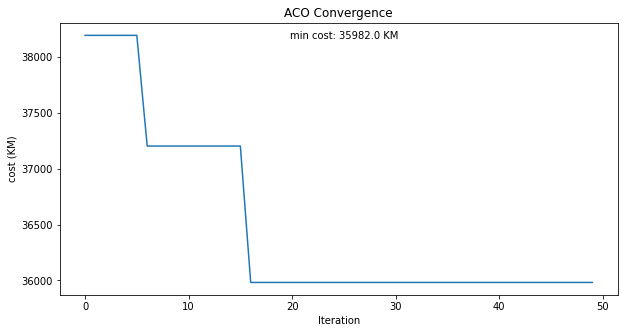

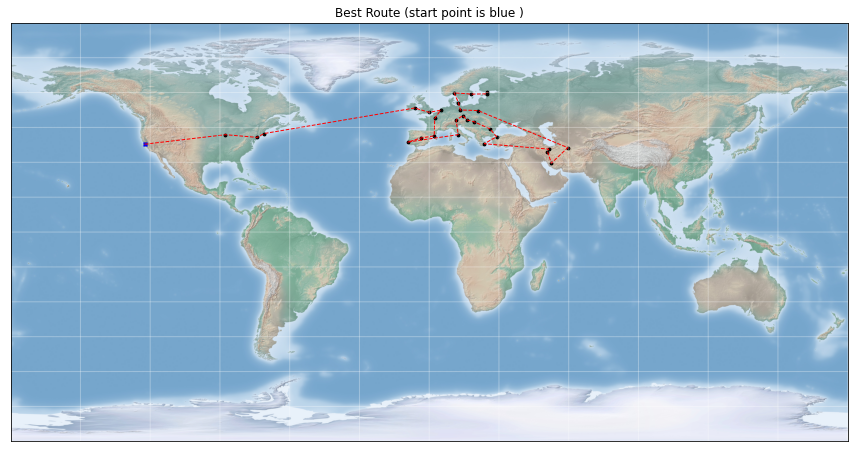

In [37]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 
rho: 0.5 
q: 10 -> 100
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(q = 100)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(q = 100)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## strategy = 1 (ant-quality)

ACO completed
TSP for 30 cities
Minimum travelling cost 35072.0 KM
Evolution in 0.6438405513763428 s
-----------------
Best Path : 
-----------------
1. Dublin
2. London
3. Paris
4. Amsterdam
5. Munich
6. Prague
7. Vienna
8. Budapest
9. Warsaw
10. Berlin
11. Copenhagen
12. Oslo
13. Stockholm
14. Tallinn
15. Helsinki
16. Tehran
17. Qom
18. Shiraz
19. Mashhad
20. Istanbul
21. Bucharest
22. Athens
23. Rome
24. Barcelona
25. Madrid
26. Lisbon
27. Boston
28. New York
29. Chicago
30. San Francisco


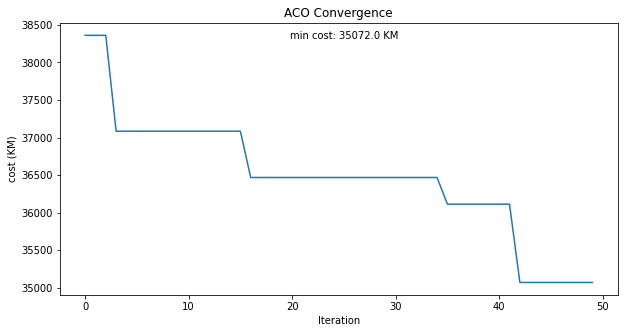

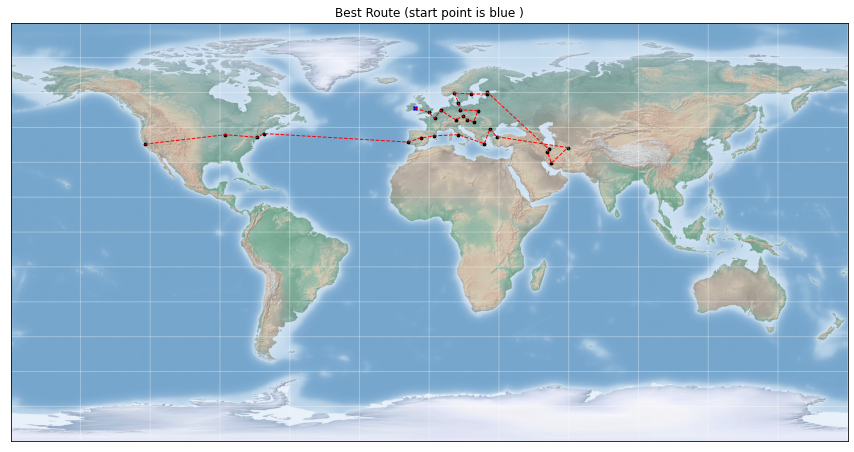

In [38]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 
rho: 0.5 
q: 10 -> 100
strategy: 2 - ant-density ->  1 - ant-quality

run_number = 50
'''
run_number = 50

aco = ACO(strategy = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(strategy = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## strategy = 0 (ant-cycle)

ACO completed
TSP for 30 cities
Minimum travelling cost 35446.0 KM
Evolution in 0.6507580280303955 s
-----------------
Best Path : 
-----------------
1. San Francisco
2. Chicago
3. New York
4. Boston
5. Lisbon
6. Madrid
7. Barcelona
8. Rome
9. Munich
10. Prague
11. Vienna
12. Budapest
13. Bucharest
14. Istanbul
15. Athens
16. Qom
17. Tehran
18. Shiraz
19. Mashhad
20. Tallinn
21. Helsinki
22. Stockholm
23. Oslo
24. Copenhagen
25. Berlin
26. Warsaw
27. Amsterdam
28. London
29. Paris
30. Dublin


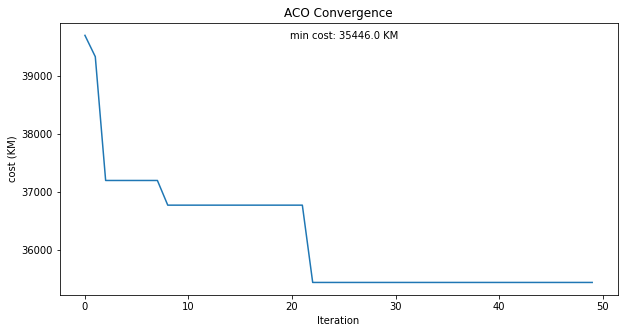

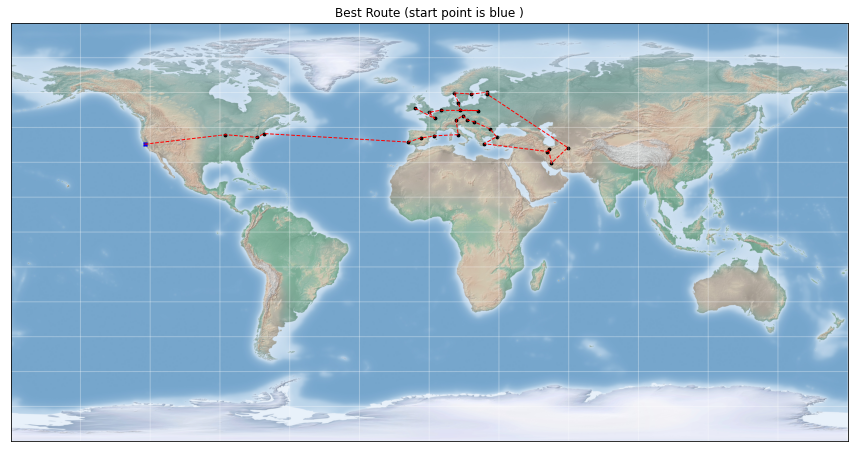

In [39]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 
beta: 10.0 
rho: 0.5 
q: 10 
strategy: 2 - ant-density -> 0 - ant-cycle

run_number = 50
'''
run_number = 50

aco = ACO(strategy = 0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(strategy = 0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## ant_count = 100 & beta = 5.0 & rho = 0.9 & q = 1 & strategy = 1 (ant-quality)

ACO completed
TSP for 30 cities
Minimum travelling cost 34744.0 KM
Evolution in 6.8792572021484375 s
-----------------
Best Path : 
-----------------
1. Mashhad
2. Shiraz
3. Qom
4. Tehran
5. Istanbul
6. Bucharest
7. Athens
8. Rome
9. Barcelona
10. Madrid
11. Lisbon
12. Boston
13. New York
14. Chicago
15. San Francisco
16. Dublin
17. London
18. Amsterdam
19. Paris
20. Munich
21. Prague
22. Vienna
23. Budapest
24. Warsaw
25. Berlin
26. Copenhagen
27. Oslo
28. Stockholm
29. Tallinn
30. Helsinki


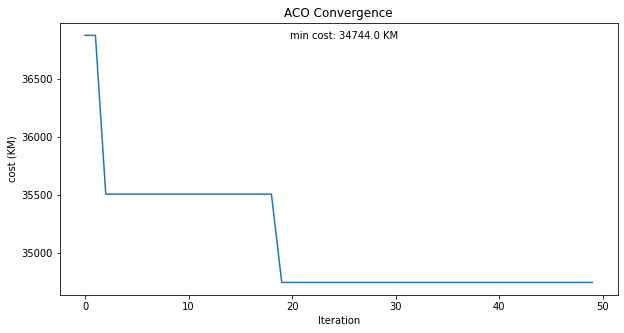

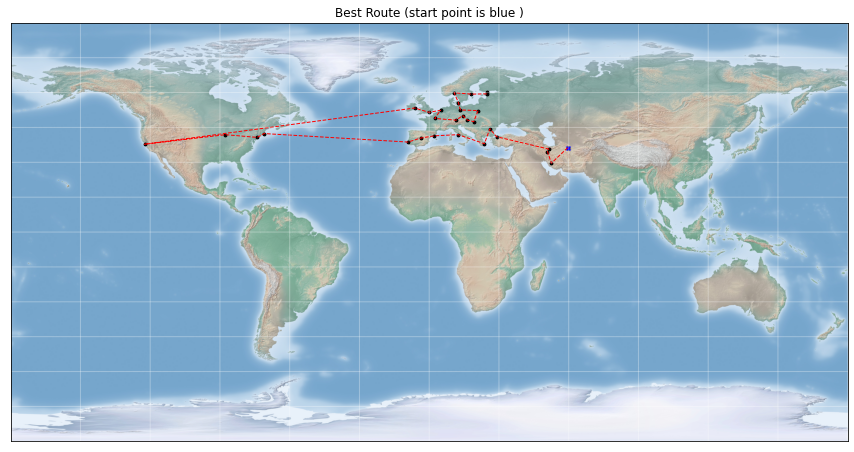

In [40]:
'''
defult parameters:
ant_count: 10 -> 100 
generations: 50
alpha: 1.0 
beta: 10.0 -> 5.0
rho: 0.5 -> 0.9
q: 10 -> 1
strategy: 2 - ant-density -> 1 - ant-quality

run_number = 50
'''
run_number = 50

aco = ACO(ant_count = 100 , beta = 5.0 , rho = 0.9 , q = 1 ,strategy = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(ant_count = 100 , beta = 5.0 , rho = 0.9 , q = 1 ,strategy = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

# 50 Cities

In [41]:
# 30 cities
cities = """New York,USA
Tokyo,Japan
Osaka,Japan
Kyoto,Japan
Beijing,China
Shanghai,China
Shenzhen,China
Guangzhou,China
Tianjin,China
Chongqing,China
Wuhan,China
Buenos Aires,Argentina
Rio de Janeiro,Brazil
Santiago,Chile
Bogota,Colombia
Lima,Peru
Quito,Ecuador
Cartagena,Colombia
Salvador,Brazil
Brasilia,Brazil
Cali,Colombia
Munich,Germany
Warsaw,Poland
Stockholm,Sweden
Barcelona,Spain
Helsinki,Finland
Tallinn,Estonia
Amsterdam,Netherlands
Prague,the Czech Republic
Madrid,Spain
Rome,Italy
Budapest,Hungary
Lisbon,Portugal
Copenhagen,Denmark
Dublin,Republic of Ireland
Athens,Greece
Berlin,Germany
Chicago,USA
London,UK
Paris,France
Tehran,Iran
Oslo,Norway
Istanbul,Turkey
Bucharest,Romania
Shiraz,Iran
Mashhad,Iran
Qom,Iran
San Francisco,USA
Vienna,Austria
Boston,USA"""

In [42]:
result = get_city_country(cities)
dataset = make_dataset(result[0],result[1])
dataset = fill_lat_lng(dataset)
city_dict = make_dict_from_dataset(dataset)
names_dict = make_city_name(city_dict)
dataset.head()

['New York', 'Tokyo', 'Osaka', 'Kyoto', 'Beijing', 'Shanghai', 'Shenzhen', 'Guangzhou', 'Tianjin', 'Chongqing', 'Wuhan', 'Buenos Aires', 'Rio de Janeiro', 'Santiago', 'Bogota', 'Lima', 'Quito', 'Cartagena', 'Salvador', 'Brasilia', 'Cali', 'Munich', 'Warsaw', 'Stockholm', 'Barcelona', 'Helsinki', 'Tallinn', 'Amsterdam', 'Prague', 'Madrid', 'Rome', 'Budapest', 'Lisbon', 'Copenhagen', 'Dublin', 'Athens', 'Berlin', 'Chicago', 'London', 'Paris', 'Tehran', 'Oslo', 'Istanbul', 'Bucharest', 'Shiraz', 'Mashhad', 'Qom', 'San Francisco', 'Vienna', 'Boston']
['USA', 'Japan', 'Japan', 'Japan', 'China', 'China', 'China', 'China', 'China', 'China', 'China', 'Argentina', 'Brazil', 'Chile', 'Colombia', 'Peru', 'Ecuador', 'Colombia', 'Brazil', 'Brazil', 'Colombia', 'Germany', 'Poland', 'Sweden', 'Spain', 'Finland', 'Estonia', 'Netherlands', 'the Czech Republic', 'Spain', 'Italy', 'Hungary', 'Portugal', 'Denmark', 'Republic of Ireland', 'Greece', 'Germany', 'USA', 'UK', 'France', 'Iran', 'Norway', 'Turke

,City,Country,lat,lng
City,,,,
New York,New York,USA,40.712728,-74.006015
Tokyo,Tokyo,Japan,35.682839,139.759455
Osaka,Osaka,Japan,34.619881,135.490357
Kyoto,Kyoto,Japan,35.021041,135.755607
Beijing,Beijing,China,39.902080,116.718521


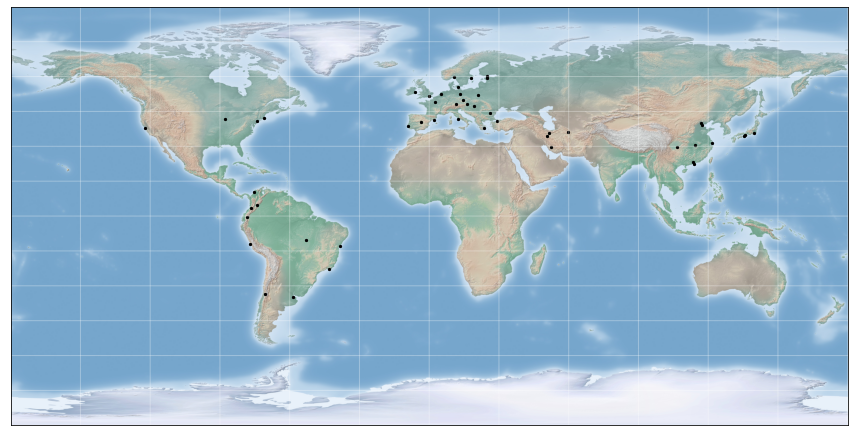

In [43]:
draw_cities_in_map(dataset)

## defult parameters

ACO completed
TSP for 50 cities
Minimum travelling cost 60009.0 KM
Evolution in 1.9029440879821777 s
-----------------
Best Path : 
-----------------
1. Dublin
2. London
3. Paris
4. Amsterdam
5. Berlin
6. Copenhagen
7. Oslo
8. Stockholm
9. Tallinn
10. Helsinki
11. Warsaw
12. Budapest
13. Vienna
14. Prague
15. Munich
16. Rome
17. Athens
18. Istanbul
19. Bucharest
20. Qom
21. Tehran
22. Shiraz
23. Mashhad
24. Chongqing
25. Guangzhou
26. Shenzhen
27. Wuhan
28. Shanghai
29. Tianjin
30. Beijing
31. Osaka
32. Kyoto
33. Tokyo
34. San Francisco
35. Chicago
36. New York
37. Boston
38. Cartagena
39. Bogota
40. Cali
41. Quito
42. Lima
43. Santiago
44. Buenos Aires
45. Rio de Janeiro
46. Salvador
47. Brasilia
48. Lisbon
49. Madrid
50. Barcelona


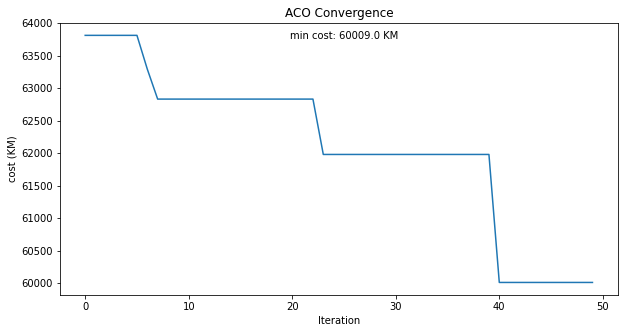

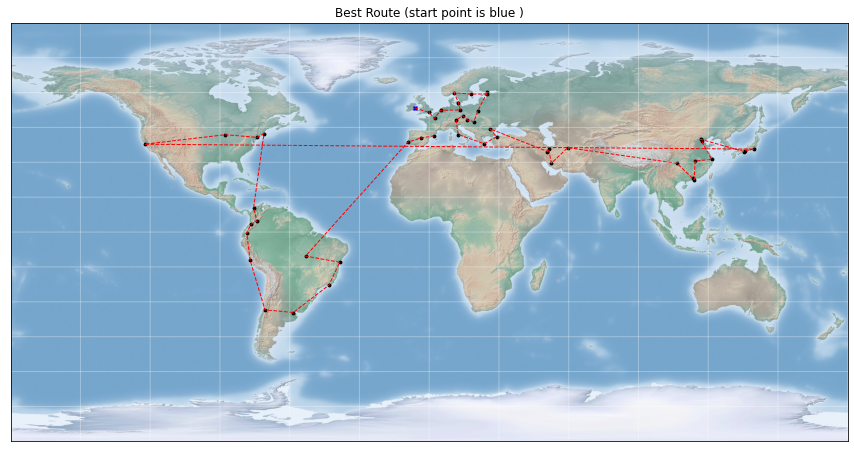

In [44]:
'''
defult parameters:
ant_count: 10
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO()
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO()
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## ant_count = 1

ACO completed
TSP for 50 cities
Minimum travelling cost 61354.0 KM
Evolution in 0.21352863311767578 s
-----------------
Best Path : 
-----------------
1. Tehran
2. Qom
3. Shiraz
4. Mashhad
5. Beijing
6. Tianjin
7. Wuhan
8. Chongqing
9. Guangzhou
10. Shenzhen
11. Shanghai
12. Osaka
13. Kyoto
14. Tokyo
15. San Francisco
16. Chicago
17. New York
18. Boston
19. Cartagena
20. Cali
21. Bogota
22. Quito
23. Lima
24. Santiago
25. Buenos Aires
26. Rio de Janeiro
27. Salvador
28. Brasilia
29. Lisbon
30. Madrid
31. Barcelona
32. Paris
33. London
34. Amsterdam
35. Dublin
36. Munich
37. Rome
38. Vienna
39. Prague
40. Berlin
41. Copenhagen
42. Oslo
43. Stockholm
44. Helsinki
45. Tallinn
46. Warsaw
47. Budapest
48. Bucharest
49. Istanbul
50. Athens


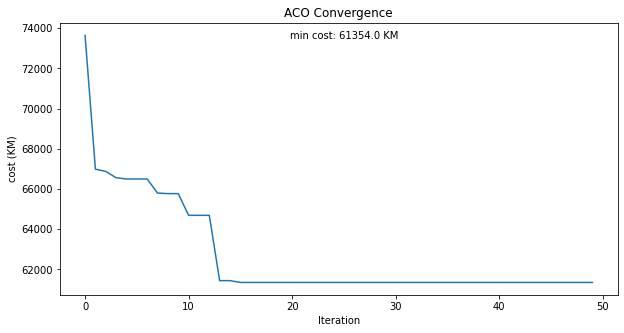

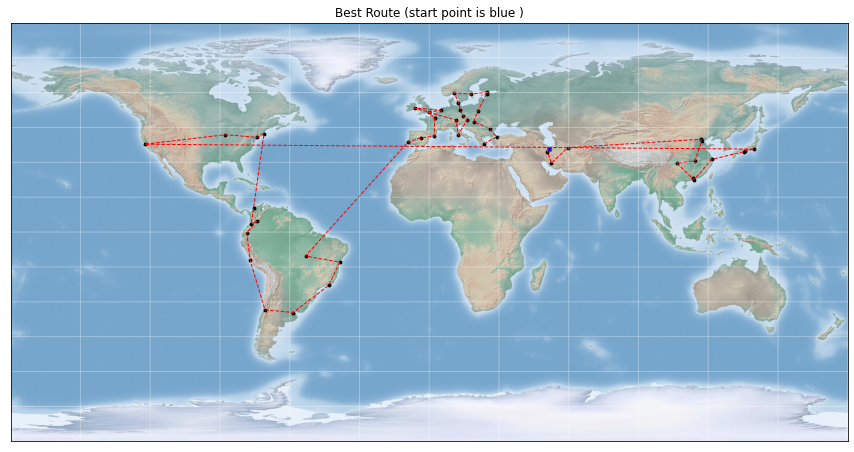

In [45]:
'''
defult parameters:
ant_count: 10 -> 1
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(ant_count = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(ant_count = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## ant_count = 50

ACO completed
TSP for 50 cities
Minimum travelling cost 59880.0 KM
Evolution in 9.874952554702759 s
-----------------
Best Path : 
-----------------
1. London
2. Paris
3. Amsterdam
4. Berlin
5. Copenhagen
6. Oslo
7. Stockholm
8. Tallinn
9. Helsinki
10. Warsaw
11. Budapest
12. Vienna
13. Prague
14. Munich
15. Rome
16. Athens
17. Istanbul
18. Bucharest
19. Tehran
20. Qom
21. Shiraz
22. Mashhad
23. Chongqing
24. Guangzhou
25. Shenzhen
26. Wuhan
27. Shanghai
28. Tianjin
29. Beijing
30. Osaka
31. Kyoto
32. Tokyo
33. San Francisco
34. Chicago
35. New York
36. Boston
37. Cartagena
38. Bogota
39. Cali
40. Quito
41. Lima
42. Santiago
43. Buenos Aires
44. Rio de Janeiro
45. Salvador
46. Brasilia
47. Lisbon
48. Madrid
49. Barcelona
50. Dublin


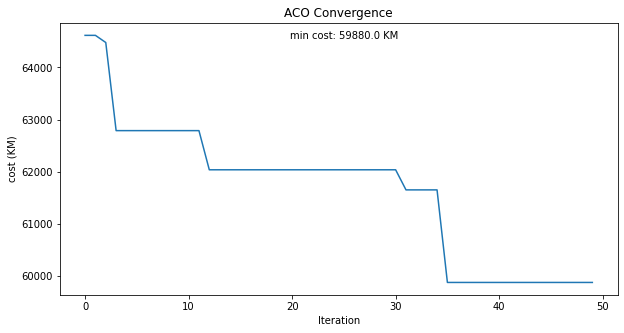

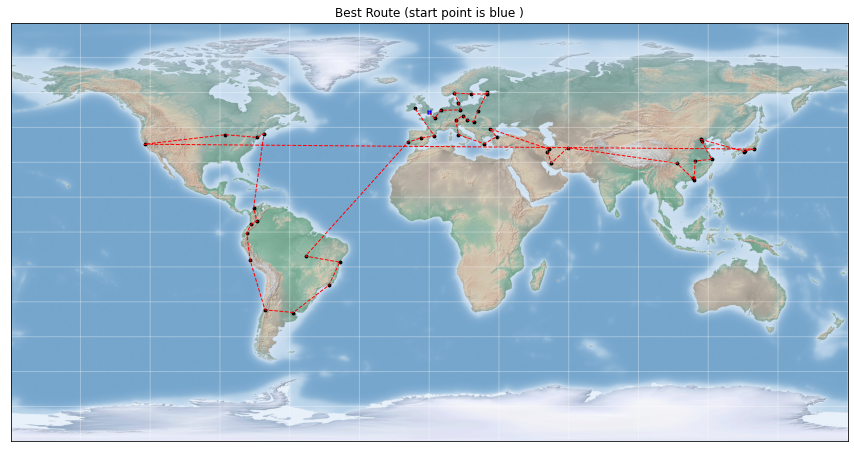

In [53]:
'''
defult parameters:
ant_count: 10 -> 50
generations: 50
alpha: 1.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(ant_count = 50)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(ant_count = 50)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## alpha = 5.0

ACO completed
TSP for 50 cities
Minimum travelling cost 61061.0 KM
Evolution in 1.9795405864715576 s
-----------------
Best Path : 
-----------------
1. Guangzhou
2. Shenzhen
3. Wuhan
4. Shanghai
5. Tianjin
6. Beijing
7. Kyoto
8. Osaka
9. Tokyo
10. San Francisco
11. Chicago
12. New York
13. Boston
14. Cartagena
15. Bogota
16. Cali
17. Quito
18. Lima
19. Santiago
20. Buenos Aires
21. Rio de Janeiro
22. Salvador
23. Brasilia
24. Lisbon
25. Madrid
26. Barcelona
27. Rome
28. Vienna
29. Budapest
30. Munich
31. Paris
32. London
33. Amsterdam
34. Dublin
35. Oslo
36. Stockholm
37. Tallinn
38. Helsinki
39. Warsaw
40. Copenhagen
41. Berlin
42. Prague
43. Bucharest
44. Istanbul
45. Athens
46. Tehran
47. Qom
48. Shiraz
49. Mashhad
50. Chongqing


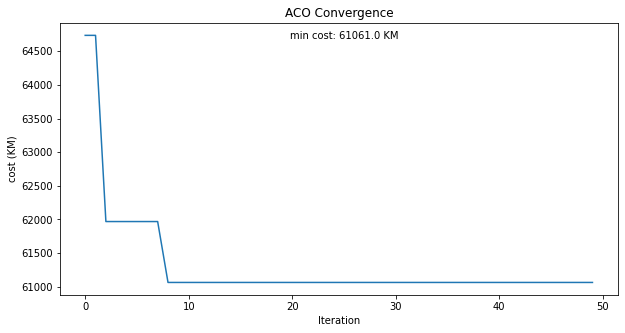

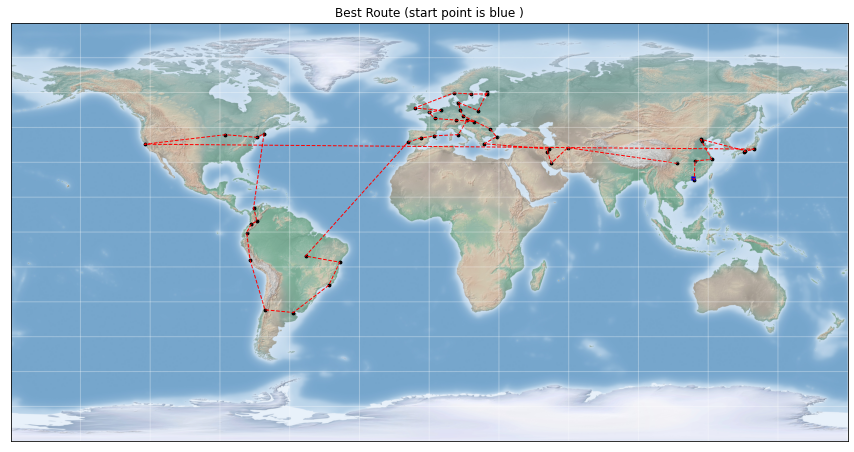

In [48]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 -> 5.0
beta: 10
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(alpha = 5.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(alpha = 5.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## beta = 5.0

ACO completed
TSP for 50 cities
Minimum travelling cost 60342.0 KM
Evolution in 1.8994030952453613 s
-----------------
Best Path : 
-----------------
1. Buenos Aires
2. Santiago
3. Lima
4. Quito
5. Cali
6. Bogota
7. Cartagena
8. New York
9. Boston
10. Chicago
11. San Francisco
12. Tokyo
13. Kyoto
14. Osaka
15. Tianjin
16. Beijing
17. Shanghai
18. Wuhan
19. Guangzhou
20. Shenzhen
21. Chongqing
22. Mashhad
23. Shiraz
24. Qom
25. Tehran
26. Bucharest
27. Istanbul
28. Athens
29. Rome
30. Munich
31. Prague
32. Vienna
33. Budapest
34. Warsaw
35. Berlin
36. Copenhagen
37. Oslo
38. Stockholm
39. Tallinn
40. Helsinki
41. Dublin
42. London
43. Amsterdam
44. Paris
45. Barcelona
46. Madrid
47. Lisbon
48. Salvador
49. Brasilia
50. Rio de Janeiro


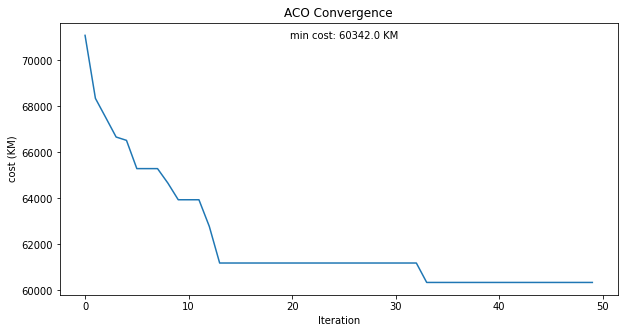

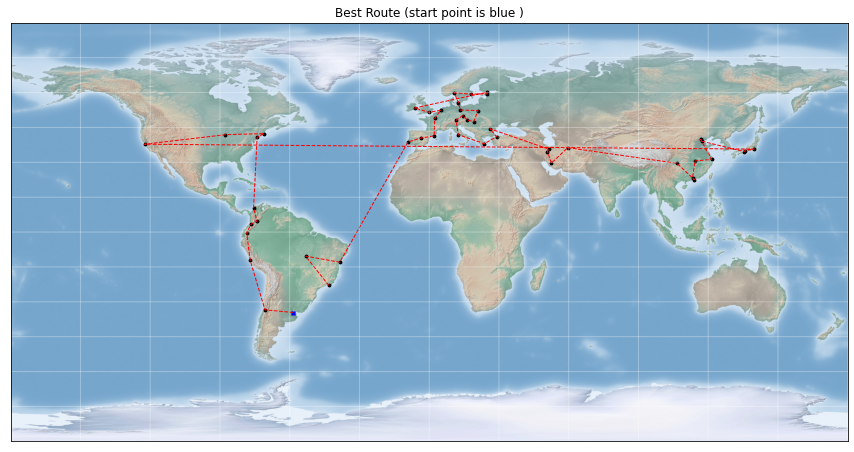

In [49]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 -> 5.0
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(beta = 5.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(beta = 5.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## beta = 1.0

ACO completed
TSP for 50 cities
Minimum travelling cost 62927.0 KM
Evolution in 1.8499178886413574 s
-----------------
Best Path : 
-----------------
1. Berlin
2. Copenhagen
3. Oslo
4. Helsinki
5. Tallinn
6. Stockholm
7. Warsaw
8. Budapest
9. Vienna
10. Prague
11. Munich
12. Rome
13. Bucharest
14. Istanbul
15. Athens
16. Tehran
17. Qom
18. Shiraz
19. Mashhad
20. Shenzhen
21. Guangzhou
22. Wuhan
23. Chongqing
24. Beijing
25. Tianjin
26. Shanghai
27. Tokyo
28. Kyoto
29. Osaka
30. San Francisco
31. Chicago
32. Boston
33. New York
34. Cartagena
35. Bogota
36. Cali
37. Quito
38. Lima
39. Santiago
40. Buenos Aires
41. Rio de Janeiro
42. Salvador
43. Brasilia
44. Lisbon
45. Madrid
46. Barcelona
47. Dublin
48. Amsterdam
49. Paris
50. London


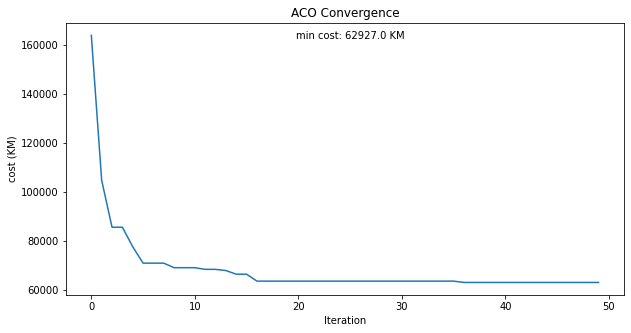

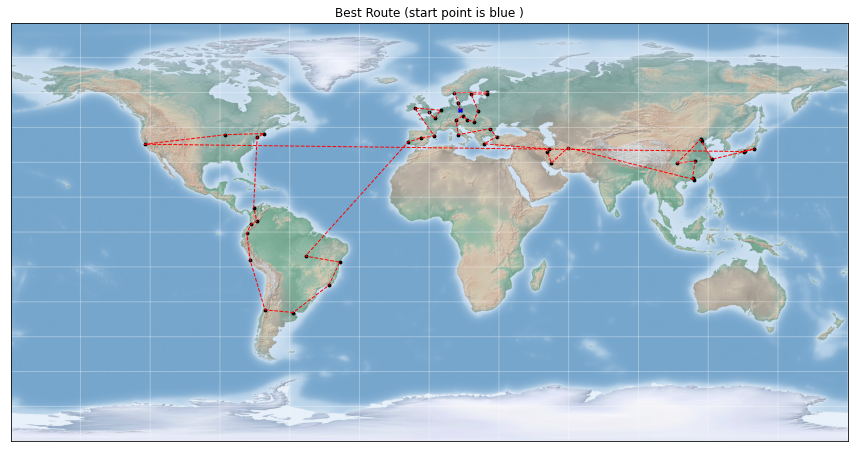

In [50]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 -> 1.0
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(beta = 1.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(beta = 1.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## alpha = 5.0 & beta = 5.0

ACO completed
TSP for 50 cities
Minimum travelling cost 61271.0 KM
Evolution in 1.9922173023223877 s
-----------------
Best Path : 
-----------------
1. Tehran
2. Qom
3. Shiraz
4. Mashhad
5. Chongqing
6. Guangzhou
7. Shenzhen
8. Wuhan
9. Shanghai
10. Tianjin
11. Beijing
12. Osaka
13. Kyoto
14. Tokyo
15. San Francisco
16. Chicago
17. New York
18. Boston
19. Cartagena
20. Bogota
21. Cali
22. Quito
23. Lima
24. Santiago
25. Buenos Aires
26. Rio de Janeiro
27. Salvador
28. Brasilia
29. Lisbon
30. Barcelona
31. Madrid
32. Paris
33. Dublin
34. Amsterdam
35. London
36. Munich
37. Prague
38. Berlin
39. Copenhagen
40. Oslo
41. Stockholm
42. Tallinn
43. Helsinki
44. Warsaw
45. Budapest
46. Vienna
47. Rome
48. Bucharest
49. Istanbul
50. Athens


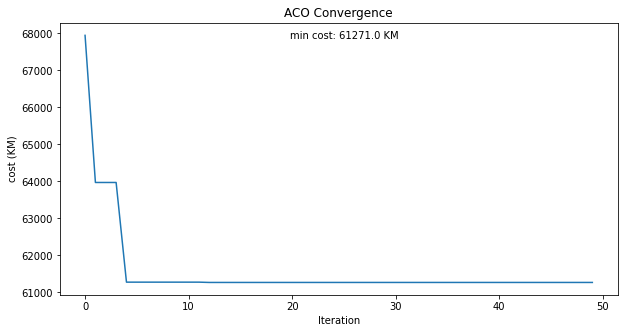

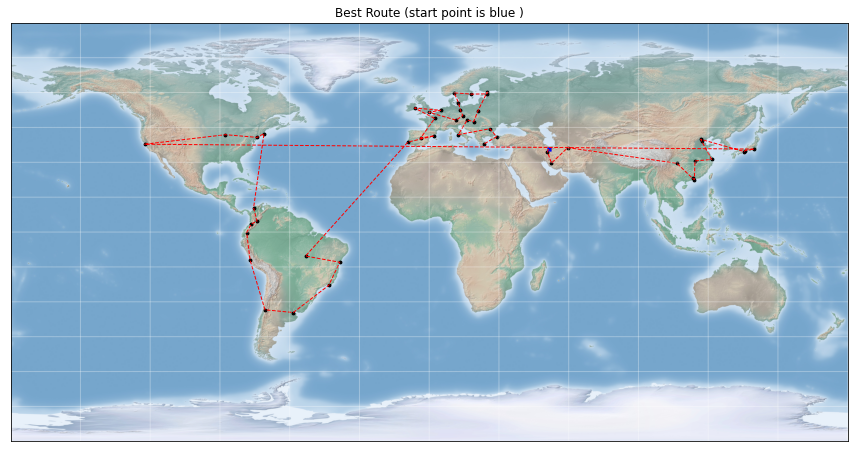

In [51]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0 -> 5.0
beta: 10 -> 5.0
rho: 0.5
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(alpha = 5.0 ,beta = 5.0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(alpha = 5.0 ,beta = 5.0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## rho = 0.9

ACO completed
TSP for 50 cities
Minimum travelling cost 60707.0 KM
Evolution in 1.9131486415863037 s
-----------------
Best Path : 
-----------------
1. Copenhagen
2. Berlin
3. Prague
4. Vienna
5. Budapest
6. Warsaw
7. Munich
8. Rome
9. Athens
10. Istanbul
11. Bucharest
12. Tehran
13. Qom
14. Shiraz
15. Mashhad
16. Chongqing
17. Wuhan
18. Guangzhou
19. Shenzhen
20. Shanghai
21. Tianjin
22. Beijing
23. Kyoto
24. Osaka
25. Tokyo
26. San Francisco
27. Chicago
28. New York
29. Boston
30. Cartagena
31. Bogota
32. Cali
33. Quito
34. Lima
35. Santiago
36. Buenos Aires
37. Rio de Janeiro
38. Salvador
39. Brasilia
40. Lisbon
41. Madrid
42. Barcelona
43. Paris
44. London
45. Amsterdam
46. Dublin
47. Oslo
48. Stockholm
49. Tallinn
50. Helsinki


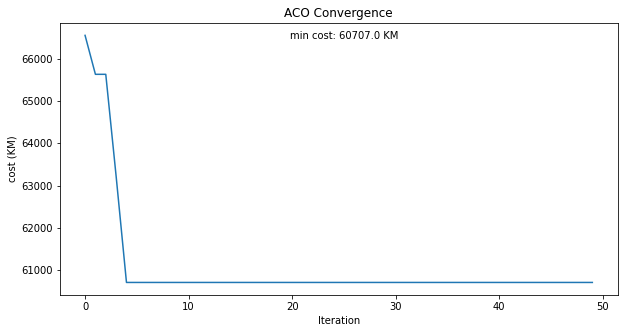

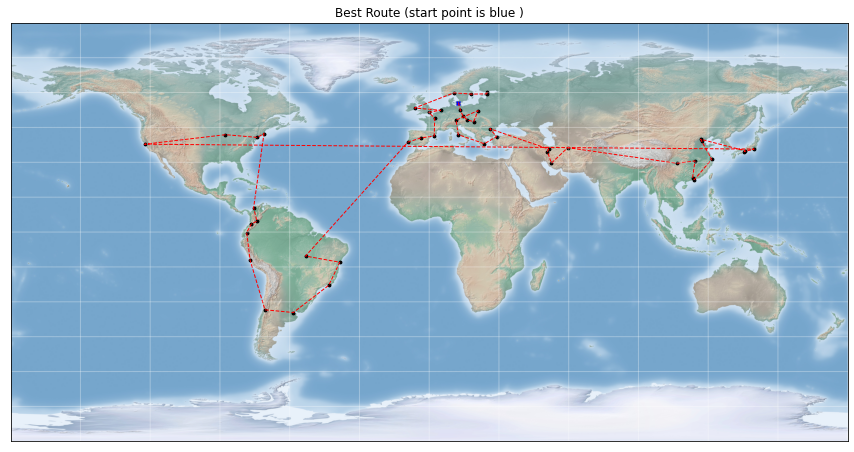

In [52]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 
rho: 0.5 -> 0.9
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(rho = 0.9)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(rho = 0.9)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## rho = 0.1

In [52]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 
rho: 0.5 -> 0.1
q: 10
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(rho = 0.1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(rho = 0.1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## q = 1

ACO completed
TSP for 50 cities
Minimum travelling cost 60588.0 KM
Evolution in 1.9551663398742676 s
-----------------
Best Path : 
-----------------
1. Rome
2. Munich
3. Prague
4. Berlin
5. Copenhagen
6. Oslo
7. Stockholm
8. Tallinn
9. Helsinki
10. Warsaw
11. Budapest
12. Vienna
13. Bucharest
14. Istanbul
15. Athens
16. Tehran
17. Qom
18. Shiraz
19. Mashhad
20. Chongqing
21. Guangzhou
22. Shenzhen
23. Wuhan
24. Shanghai
25. Tianjin
26. Beijing
27. Kyoto
28. Osaka
29. Tokyo
30. San Francisco
31. Chicago
32. New York
33. Boston
34. Cartagena
35. Bogota
36. Cali
37. Quito
38. Lima
39. Santiago
40. Buenos Aires
41. Rio de Janeiro
42. Salvador
43. Brasilia
44. Lisbon
45. Madrid
46. Barcelona
47. Dublin
48. London
49. Paris
50. Amsterdam


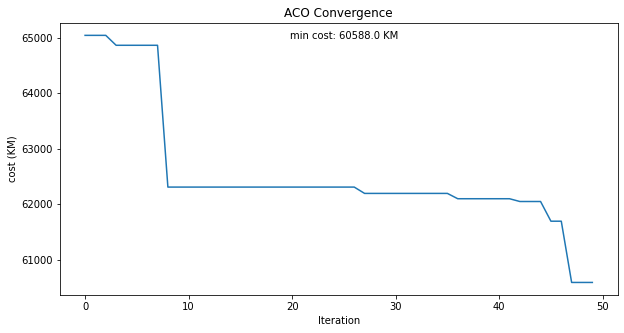

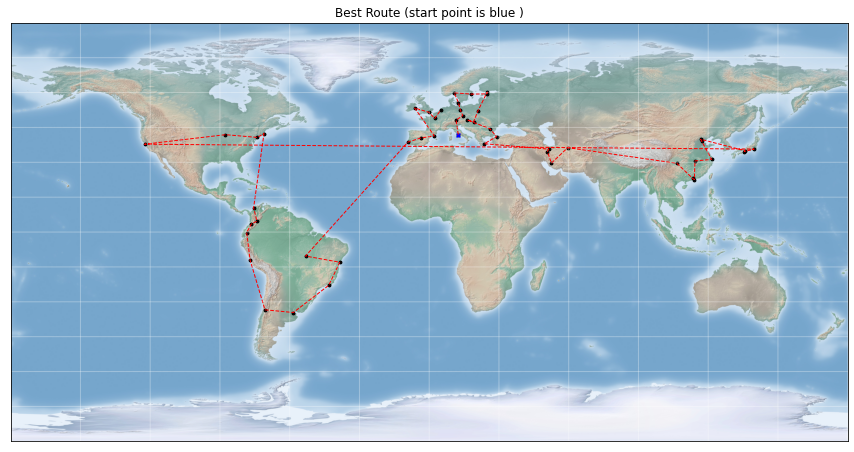

In [54]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 
rho: 0.5 
q: 10 -> 1
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(q = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(q = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## q = 100

ACO completed
TSP for 50 cities
Minimum travelling cost 60844.0 KM
Evolution in 1.901937484741211 s
-----------------
Best Path : 
-----------------
1. Rome
2. Munich
3. Prague
4. Vienna
5. Budapest
6. Warsaw
7. Berlin
8. Copenhagen
9. Oslo
10. Stockholm
11. Tallinn
12. Helsinki
13. Bucharest
14. Istanbul
15. Athens
16. Tehran
17. Qom
18. Shiraz
19. Mashhad
20. Chongqing
21. Guangzhou
22. Shenzhen
23. Wuhan
24. Shanghai
25. Tianjin
26. Beijing
27. Osaka
28. Kyoto
29. Tokyo
30. San Francisco
31. Chicago
32. New York
33. Boston
34. Cartagena
35. Bogota
36. Cali
37. Quito
38. Lima
39. Santiago
40. Buenos Aires
41. Rio de Janeiro
42. Salvador
43. Brasilia
44. Lisbon
45. Madrid
46. Barcelona
47. Dublin
48. London
49. Amsterdam
50. Paris


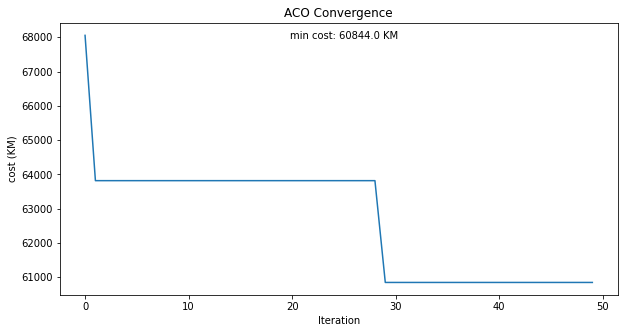

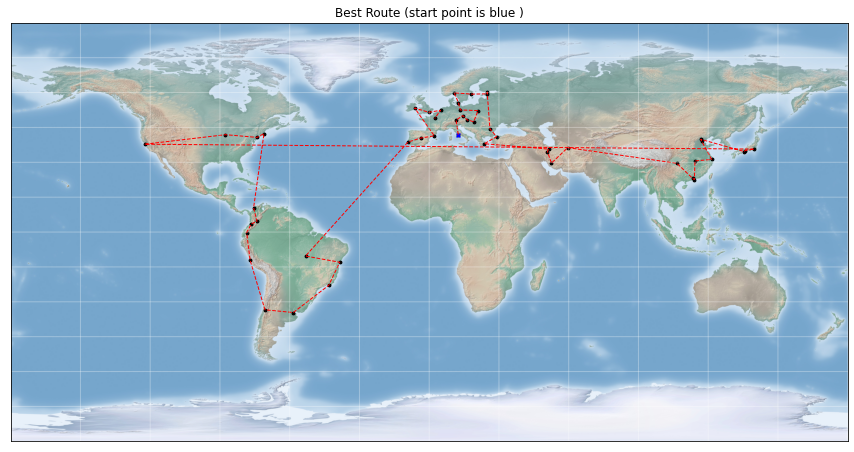

In [55]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 
rho: 0.5 
q: 10 -> 100
strategy: 2 - ant-density

run_number = 50
'''
run_number = 50

aco = ACO(q = 100)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(q = 100)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## strategy = 1

ACO completed
TSP for 50 cities
Minimum travelling cost 60910.0 KM
Evolution in 1.9297914505004883 s
-----------------
Best Path : 
-----------------
1. Guangzhou
2. Shenzhen
3. Wuhan
4. Shanghai
5. Tianjin
6. Beijing
7. Kyoto
8. Osaka
9. Tokyo
10. San Francisco
11. Chicago
12. New York
13. Boston
14. Cartagena
15. Bogota
16. Cali
17. Quito
18. Lima
19. Santiago
20. Buenos Aires
21. Rio de Janeiro
22. Salvador
23. Brasilia
24. Lisbon
25. Madrid
26. Barcelona
27. Rome
28. Munich
29. Prague
30. Vienna
31. Budapest
32. Warsaw
33. Copenhagen
34. Berlin
35. Amsterdam
36. London
37. Paris
38. Dublin
39. Oslo
40. Stockholm
41. Tallinn
42. Helsinki
43. Bucharest
44. Istanbul
45. Athens
46. Tehran
47. Qom
48. Shiraz
49. Mashhad
50. Chongqing


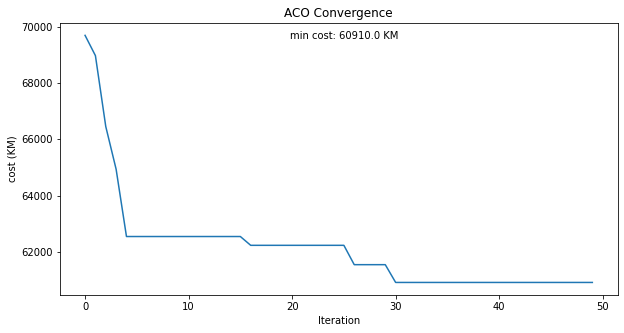

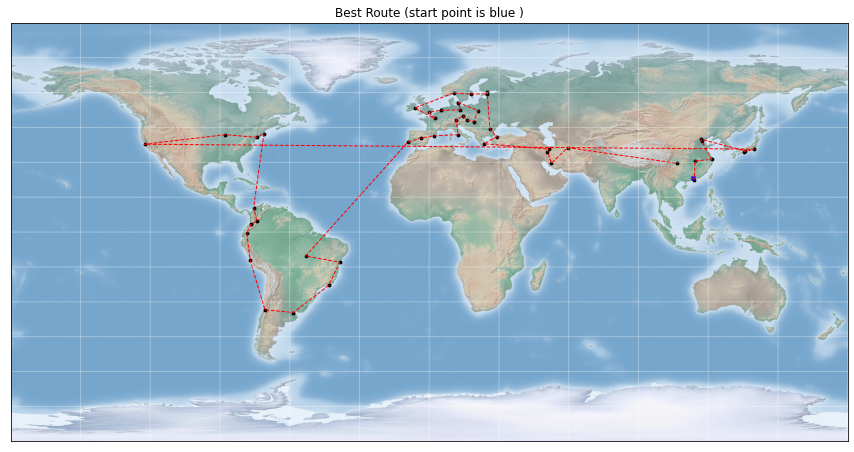

In [56]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 
rho: 0.5 
q: 10 
strategy: 2 - ant-density -> 1

run_number = 50
'''
run_number = 50

aco = ACO(strategy = 1)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(strategy = 1)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## strategy = 0

ACO completed
TSP for 50 cities
Minimum travelling cost 60262.0 KM
Evolution in 1.892418384552002 s
-----------------
Best Path : 
-----------------
1. London
2. Paris
3. Amsterdam
4. Copenhagen
5. Oslo
6. Stockholm
7. Tallinn
8. Helsinki
9. Warsaw
10. Berlin
11. Prague
12. Vienna
13. Budapest
14. Munich
15. Rome
16. Athens
17. Istanbul
18. Bucharest
19. Qom
20. Tehran
21. Shiraz
22. Mashhad
23. Chongqing
24. Guangzhou
25. Shenzhen
26. Wuhan
27. Shanghai
28. Tianjin
29. Beijing
30. Kyoto
31. Osaka
32. Tokyo
33. San Francisco
34. Chicago
35. New York
36. Boston
37. Cartagena
38. Bogota
39. Cali
40. Quito
41. Lima
42. Santiago
43. Buenos Aires
44. Rio de Janeiro
45. Salvador
46. Brasilia
47. Lisbon
48. Madrid
49. Barcelona
50. Dublin


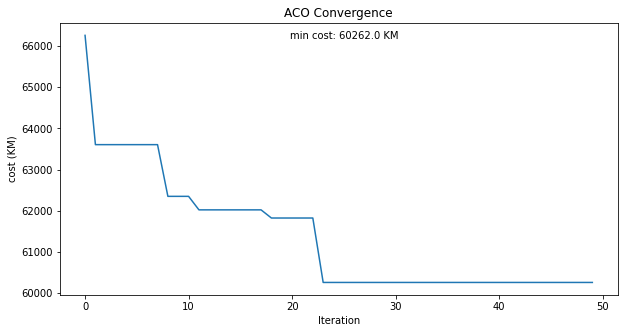

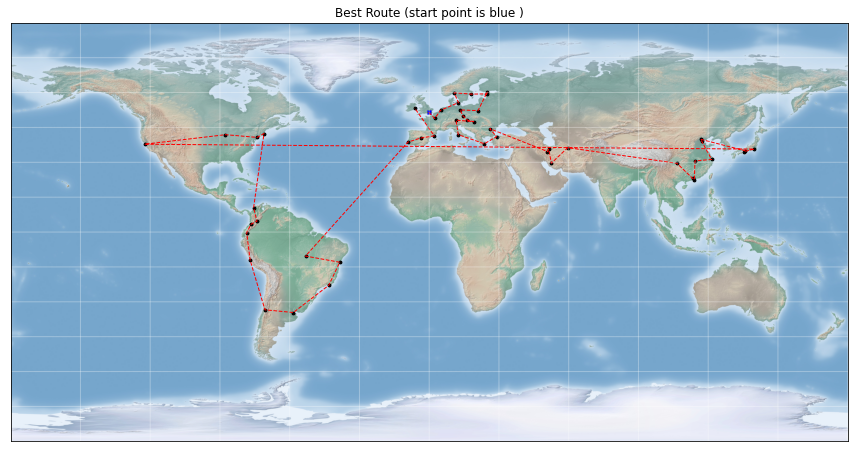

In [57]:
'''
defult parameters:
ant_count: 10 
generations: 50
alpha: 1.0
beta: 10 
rho: 0.5 
q: 10 
strategy: 2 - ant-density -> 0

run_number = 50
'''
run_number = 50

aco = ACO(strategy = 0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(strategy = 0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)

## ant_count = 50 & beta = 5.0 & alpha = 5.0 & q = 1 & strategy = 0

ACO completed
TSP for 50 cities
Minimum travelling cost 90648.0 KM
Evolution in 10.398036003112793 s
-----------------
Best Path : 
-----------------
1. Prague
2. Stockholm
3. Helsinki
4. Oslo
5. Tallinn
6. Lisbon
7. London
8. Berlin
9. Madrid
10. Paris
11. Bucharest
12. Istanbul
13. Qom
14. Tehran
15. Mashhad
16. Brasilia
17. Rio de Janeiro
18. Salvador
19. Buenos Aires
20. Santiago
21. Quito
22. Bogota
23. Lima
24. Cali
25. Cartagena
26. New York
27. Boston
28. Chicago
29. San Francisco
30. Tokyo
31. Beijing
32. Tianjin
33. Wuhan
34. Guangzhou
35. Shenzhen
36. Shanghai
37. Osaka
38. Kyoto
39. Chongqing
40. Shiraz
41. Athens
42. Vienna
43. Budapest
44. Dublin
45. Rome
46. Warsaw
47. Copenhagen
48. Amsterdam
49. Munich
50. Barcelona


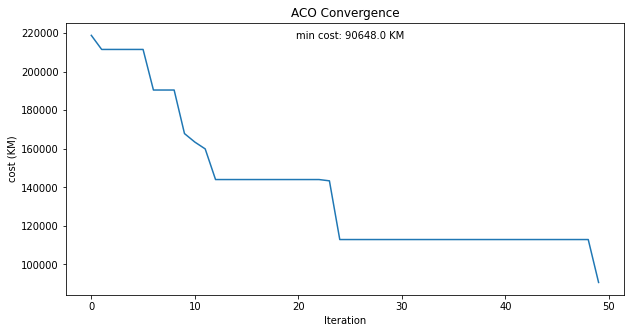

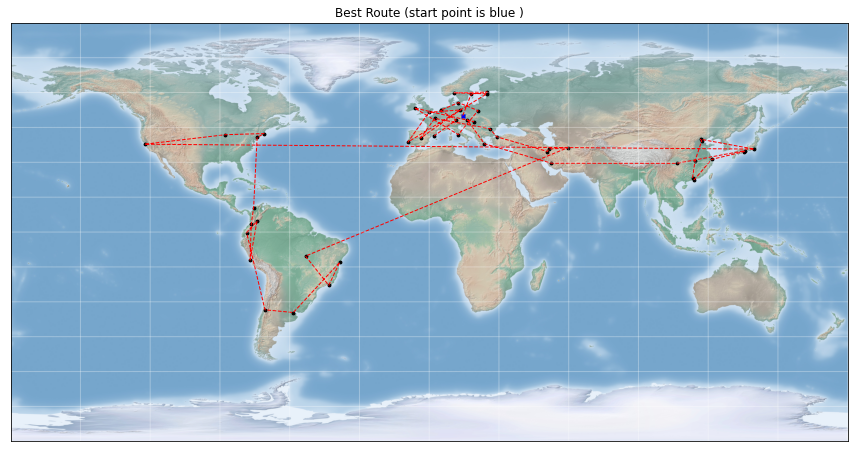

In [58]:
'''
defult parameters:
ant_count: 10 -> 50
generations: 50
alpha: 1.0 -> 5.0
beta: 10 -> 5/0
rho: 0.5 
q: 10 -> 1
strategy: 2 - ant-density -> 0

run_number = 50
'''
run_number = 50

aco = ACO(ant_count = 50 ,alpha = 0.5 ,beta = 0.5 , q = 1 , strategy = 0)
cost_matrix = make_cost_matrix(city_dict)
graph = Graph(cost_matrix, rank = len(city_dict.keys()))
start = time.time()
path, cost = aco.solve(graph)
end = time.time()

best_path,best_cost,best_time,best_history = path,cost,(end-start),aco.history['history']

for i in range(run_number):
    aco = ACO(ant_count = 50 ,alpha = 0.5 ,beta = 0.5 , q = 1 , strategy = 0)
    cost_matrix = make_cost_matrix(city_dict)
    graph = Graph(cost_matrix, rank = len(city_dict.keys()))
    start = time.time()
    path, cost = aco.solve(graph)
    end = time.time()

    if cost < best_cost:
        best_cost = cost
        best_path = path
        best_time = (end-start)
        best_history = aco.history['history']


path_names = rename_path(best_path,names_dict)
show_best_path(path_names,best_cost,best_time)
plot_aco_convergence(best_history,best_cost)
plot_route(path_names,city_dict)